<a href="https://colab.research.google.com/github/npr99/PlanningMethods/blob/master/CRISP_BlockGroupsWater_Difference_2021_06_14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Remove water from Block Group Boundaries

This notebook shows how to remove the water area from the block group boundaries.
The output shapefile will be the input for a similar notebook that will look at the difference between the block group and the network buffer around each food pantry.

Replicate example
https://gis.stackexchange.com/questions/230494/intersecting-two-shape-problem-using-geopandas/230509


In [ ]:
from shapely.geometry import shape,Polygon,MultiPolygon,mapping
import geopandas as gpd
import folium as fm

In [ ]:
filename = 'https://www2.census.gov/geo/tiger/TIGER2010/BG/2010/tl_2010_48361_bg10.zip'
# Read shapefile to GeoDataFrame
gdf1 = gpd.read_file(filename)

In [ ]:
gdf1

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"POLYGON ((-93.87696 30.09088, -93.87694 30.090..."
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"POLYGON ((-93.82333 30.07871, -93.82398 30.078..."
2,48,361,022300,2,483610223002,Block Group 2,G5030,S,4665784,279841,+30.0423350,-093.8399582,"POLYGON ((-93.82559 30.04598, -93.82514 30.045..."
3,48,361,022300,5,483610223005,Block Group 5,G5030,S,9001230,198545,+30.0482478,-093.8753227,"POLYGON ((-93.87574 30.03954, -93.87783 30.039..."
4,48,361,022300,4,483610223004,Block Group 4,G5030,S,25882500,26936004,+30.0151721,-093.8954023,"POLYGON ((-93.87928 30.03946, -93.87914 30.039..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,48,361,020500,3,483610205003,Block Group 3,G5030,S,1101697,0,+30.0828254,-093.7615463,"POLYGON ((-93.76864 30.07736, -93.77017 30.082..."
61,48,361,020500,4,483610205004,Block Group 4,G5030,S,2063860,38748,+30.0896615,-093.7577753,"POLYGON ((-93.74711 30.08777, -93.74695 30.087..."
62,48,361,020500,2,483610205002,Block Group 2,G5030,S,1058560,121177,+30.0809167,-093.7489099,"POLYGON ((-93.74068 30.07894, -93.74061 30.078..."
63,48,361,020700,4,483610207004,Block Group 4,G5030,S,3994723,15287,+30.1006722,-093.7832319,"POLYGON ((-93.77785 30.10939, -93.77763 30.109..."


In [ ]:
filename = 'https://www2.census.gov/geo/tiger/TIGER2010/AREAWATER/tl_2010_48361_areawater.zip'
# Read shapefile to GeoDataFrame
gdf2 = gpd.read_file(filename)

In [ ]:
gdf2

,STATEFP,COUNTYFP,ANSICODE,HYDROID,FULLNAME,MTFCC,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,48,361,None,110446569315,None,H2030,0,2786,+30.0608828,-93.7569208,"POLYGON ((-93.75683 30.06107, -93.75678 30.061..."
1,48,361,None,110446568047,Tenmile Crk,H2030,0,85626,+30.1422150,-94.0779385,"POLYGON ((-94.08004 30.14197, -94.08009 30.142..."
2,48,361,None,110446568892,None,H2030,0,1745,+30.1557036,-93.9512394,"POLYGON ((-93.95148 30.15590, -93.95133 30.155..."
3,48,361,None,110446568003,Sra Cnl,H3010,0,28004,+30.1604410,-93.8698424,"POLYGON ((-93.87344 30.15684, -93.87353 30.156..."
4,48,361,None,110446568004,Sra Cnl,H3010,0,19201,+30.1745048,-93.8532261,"POLYGON ((-93.86091 30.17417, -93.86111 30.174..."
...,...,...,...,...,...,...,...,...,...,...,...
1486,48,361,None,110446568894,None,H2030,0,15537,+30.2343783,-93.7404916,"POLYGON ((-93.74189 30.23528, -93.74191 30.235..."
1487,48,361,None,110446568177,None,H2030,0,758,+30.2406793,-93.7356410,"POLYGON ((-93.73563 30.24092, -93.73559 30.240..."
1488,48,361,None,110446569000,None,H2030,0,1965,+30.0361482,-93.9362058,"POLYGON ((-93.93596 30.03619, -93.93592 30.036..."
1489,48,361,None,1103717594574,None,H2041,0,24834,+30.2311276,-93.8113959,"POLYGON ((-93.81209 30.23010, -93.81217 30.231..."


In [ ]:
# What location should the map be centered on?
center_x = (gdf1.bounds.minx.mean() + gdf1.bounds.maxx.mean())/2
center_y = (gdf1.bounds.miny.mean() + gdf1.bounds.maxy.mean())/2
print(f'The center of the map data file is located at {center_x} {center_y}')

# What styles and highlight options do you want?
style_function1 = lambda x: {
            'fillColor': 'transparent',
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.25
        }

highlight_function1 = lambda x: {'fillOpacity': 0.5}

style_function2 = lambda x: {
            'fillColor': 'transparent',
            'color': 'blue',
            'weight': 1,
            'fillOpacity': 0.5
        }

highlight_function2 = lambda x: {'fillOpacity': 0.5}
map = fm.Map(location=[center_y,center_x], zoom_start=10)

# to map layer in follium projection needs to be 4326 for lat lon coordinates
gdf1_4326 = gdf1.to_crs(epsg=4326)
fm.GeoJson(gdf1_4326.to_json(),
        name= 'Block Group Map',
        style_function=style_function1).add_to(map)

gdf2_4326 = gdf2.to_crs(epsg=4326)
fm.GeoJson(gdf2_4326.to_json(),
        name= 'Water Map',
        style_function=style_function2).add_to(map)

fm.LayerControl().add_to(map)

map

The center of the map data file is located at -93.8650191076923 30.112373015384613


## Calculate Area for Block Group
Need to change the projection to UTM 15N to have area calcuation in meters.
UTM 15N = EPSG 26915

https://spatialreference.org/ref/epsg/nad83-utm-zone-15n/


In [ ]:
gdf1.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [ ]:
gdf1["area4269"] = gdf1['geometry'].area
gdf1.head(2)

C:\Users\nathanael99\Miniconda3\envs\CRISP20210607\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.


,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,area4269
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"POLYGON ((-93.87696 30.09088, -93.87694 30.090...",0.001463
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"POLYGON ((-93.82333 30.07871, -93.82398 30.078...",0.007207


In [ ]:
# Reproject to UTM 15N
gdf1 = gdf1.to_crs(epsg=26915)
gdf1.crs

<Projected CRS: EPSG:26915>
Name: NAD83 / UTM zone 15N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 96°W and 90°W - onshore and offshore. Canada - Manitoba; Nunavut; Ontario. United States (USA) - Arkansas; Illinois; Iowa; Kansas; Louisiana; Michigan; Minnesota; Mississippi; Missouri; Nebraska; Oklahoma; Tennessee; Texas; Wisconsin.
- bounds: (-96.0, 25.61, -90.0, 84.0)
Coordinate Operation:
- name: UTM zone 15N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [ ]:
gdf1["area26915"] = gdf1['geometry'].area
gdf1.head(2)

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,area4269,area26915
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"POLYGON ((415494.469 3329180.035, 415496.716 3...",0.001463,1.562226e+07
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"POLYGON ((420653.484 3327793.070, 420590.260 3...",0.007207,7.699512e+07


In [ ]:
gdf1["ATOTAL10"] = gdf1["ALAND10"] + gdf1["AWATER10"]

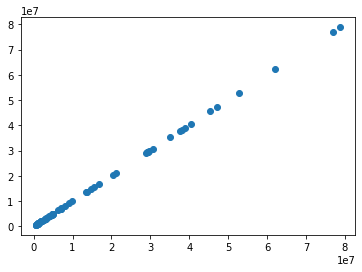

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(gdf1["area26915"] , gdf1["ATOTAL10"])
plt.show()

In [ ]:
gdf1["comparearea"] = gdf1["area26915"] - gdf1["ATOTAL10"]
gdf1.head(2)

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,area4269,area26915,comparearea,ATOTAL10
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"POLYGON ((415494.469 3329180.035, 415496.716 3...",0.001463,1.562226e+07,-9551.468353,15631809
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"POLYGON ((420653.484 3327793.070, 420590.260 3...",0.007207,7.699512e+07,-45882.251888,77041001


In [ ]:
gdf1["comparearea"].describe()

count       65.000000
mean     -9291.138493
std      11696.784784
min     -50888.252408
25%     -16766.720054
50%      -3154.948385
75%      -1289.455459
max       -368.640417
Name: comparearea, dtype: float64

In [ ]:
# Reproject to UTM 15N
gdf2 = gdf2.to_crs(epsg=26915)
gdf2.crs

<Projected CRS: EPSG:26915>
Name: NAD83 / UTM zone 15N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 96°W and 90°W - onshore and offshore. Canada - Manitoba; Nunavut; Ontario. United States (USA) - Arkansas; Illinois; Iowa; Kansas; Louisiana; Michigan; Minnesota; Mississippi; Missouri; Nebraska; Oklahoma; Tennessee; Texas; Wisconsin.
- bounds: (-96.0, 25.61, -90.0, 84.0)
Coordinate Operation:
- name: UTM zone 15N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

## Minor error in calucation of sq meters
It looks like UTM 15N does provide basis for calucating area - but there are differences in the totals between Census reported area and calculations.

## Intersect Block Group Shapefile with Water Area and Recalcuate Area

https://geopandas.readthedocs.io/en/latest/docs/user_guide/set_operations.html

In [ ]:
inter = gpd.overlay(gdf1, gdf2, how='difference')
inter.head()

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,area4269,area26915,comparearea,ATOTAL10
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"MULTIPOLYGON (((415838.655 3328681.579, 415866...",0.001463,1.562226e+07,-9551.468353,15631809
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"MULTIPOLYGON (((419145.468 3328800.208, 419121...",0.007207,7.699512e+07,-45882.251888,77041001
2,48,361,022300,2,483610223002,Block Group 2,G5030,S,4665784,279841,+30.0423350,-093.8399582,"MULTIPOLYGON (((420604.329 3323804.103, 420506...",0.000463,4.942470e+06,-3154.948385,4945625
3,48,361,022300,5,483610223005,Block Group 5,G5030,S,9001230,198545,+30.0482478,-093.8753227,"POLYGON ((415093.580 3323475.436, 414699.556 3...",0.000861,9.194034e+06,-5741.021423,9199775
4,48,361,022300,4,483610223004,Block Group 4,G5030,S,25882500,26936004,+30.0151721,-093.8954023,"MULTIPOLYGON (((418100.887 3322000.508, 418145...",0.004939,5.278610e+07,-32403.263336,52818504


In [ ]:
inter.GEOID10.describe()

count               65
unique              65
top       483610215011
freq                 1
Name: GEOID10, dtype: object

In [ ]:
inter_4326 = inter.to_crs(epsg=4326)
# What location should the map be centered on?
center_x = (inter_4326.bounds.minx.mean() + inter_4326.bounds.maxx.mean())/2
center_y = (inter_4326.bounds.miny.mean() + inter_4326.bounds.maxy.mean())/2
print(f'The center of the map data file is located at {center_x} {center_y}')

# What styles and highlight options do you want?
style_function1 = lambda x: {
            'fillColor': 'transparent',
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.25
        }

map = fm.Map(location=[center_y,center_x], zoom_start=10)

# to map layer in follium projection needs to be 4326 for lat lon coordinates
inter_4326 = inter.to_crs(epsg=4326)
fm.GeoJson(inter_4326.to_json(),
        name= 'Intersection',
        style_function=style_function1).add_to(map)


fm.LayerControl().add_to(map)

map

The center of the map data file is located at -93.86501094934759 30.11325092498531


## Recalculate Area

In [ ]:
# Reproject to UTM 15N
inter = inter.to_crs(epsg=26915)
inter.crs

<Projected CRS: EPSG:26915>
Name: NAD83 / UTM zone 15N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 96°W and 90°W - onshore and offshore. Canada - Manitoba; Nunavut; Ontario. United States (USA) - Arkansas; Illinois; Iowa; Kansas; Louisiana; Michigan; Minnesota; Mississippi; Missouri; Nebraska; Oklahoma; Tennessee; Texas; Wisconsin.
- bounds: (-96.0, 25.61, -90.0, 84.0)
Coordinate Operation:
- name: UTM zone 15N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [ ]:
inter["ALAND10_26915"] = inter['geometry'].area
inter.head(2)

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,area4269,area26915,comparearea,ATOTAL10,ALAND10_26915
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"MULTIPOLYGON (((415838.655 3328681.579, 415866...",0.001463,1.562226e+07,-9551.468353,15631809,1.487078e+07
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"MULTIPOLYGON (((419145.468 3328800.208, 419121...",0.007207,7.699512e+07,-45882.251888,77041001,6.294068e+07


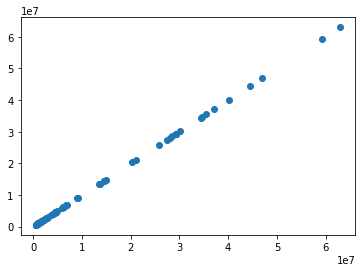

In [ ]:
plt.scatter(inter["ALAND10_26915"] , inter["ALAND10"])
plt.show()

## What percentage of the block group area is land?


In [ ]:
inter["pland"] = inter["ALAND10_26915"] / inter["area26915"]
inter.head()

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,area4269,area26915,comparearea,ATOTAL10,ALAND10_26915,pland
0,48,361,022200,1,483610222001,Block Group 1,G5030,S,14879882,751927,+30.0844677,-093.9060063,"MULTIPOLYGON (((415838.655 3328681.579, 415866...",0.001463,1.562226e+07,-9551.468353,15631809,1.487078e+07,0.951897
1,48,361,022200,2,483610222002,Block Group 2,G5030,S,62978269,14062732,+30.0530161,-093.9381833,"MULTIPOLYGON (((419145.468 3328800.208, 419121...",0.007207,7.699512e+07,-45882.251888,77041001,6.294068e+07,0.817463
2,48,361,022300,2,483610223002,Block Group 2,G5030,S,4665784,279841,+30.0423350,-093.8399582,"MULTIPOLYGON (((420604.329 3323804.103, 420506...",0.000463,4.942470e+06,-3154.948385,4945625,4.662808e+06,0.943416
3,48,361,022300,5,483610223005,Block Group 5,G5030,S,9001230,198545,+30.0482478,-093.8753227,"POLYGON ((415093.580 3323475.436, 414699.556 3...",0.000861,9.194034e+06,-5741.021423,9199775,8.995611e+06,0.978418
4,48,361,022300,4,483610223004,Block Group 4,G5030,S,25882500,26936004,+30.0151721,-093.8954023,"MULTIPOLYGON (((418100.887 3322000.508, 418145...",0.004939,5.278610e+07,-32403.263336,52818504,2.586653e+07,0.490025


In [ ]:
inter.to_file()